## Aim - To Predict the risk factor of Heart Disease

### Introduction
Heart disease, also known as cardiovascular disease, encompasses a range of conditions that affect the heart and blood vessels. It is a leading cause of morbidity and mortality worldwide. The term "heart disease" is often used interchangeably with "cardiovascular disease," and it includes conditions such as coronary artery disease, heart failure, valvular heart disease, and arrhythmias.

#### 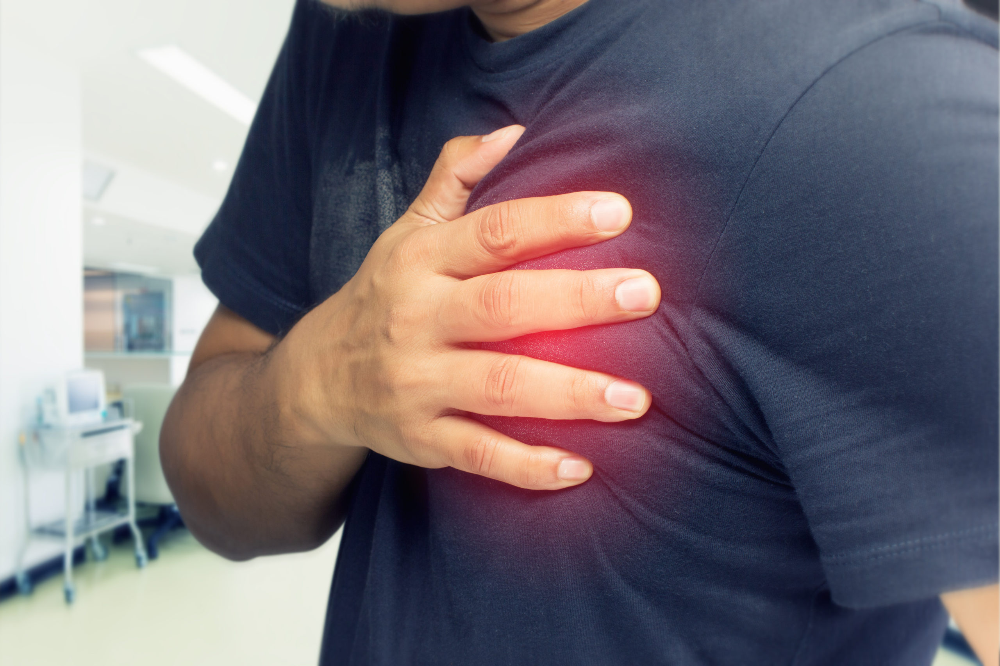

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import skew
import missingno as msno
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import PowerTransformer
from scipy import stats
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline as skPipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from scipy.stats import chi2_contingency

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import os
os.chdir('C:\\Users\\zainu\\Downloads\\Heart_Disease_dataset')

In [4]:
heart_raw = pd.read_csv("framingham.csv")

In [5]:
heart = heart_raw.copy()

In [6]:
heart.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [7]:
heart['education'].unique()

array([ 4.,  2.,  1.,  3., nan])

### 1. Structure investigation

In [8]:
heart.shape

(4240, 16)

**In our dataset there are 4240 records and 16 columns (variables)**

In [9]:
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             4240 non-null   int64  
 1   age              4240 non-null   int64  
 2   education        4135 non-null   float64
 3   currentSmoker    4240 non-null   int64  
 4   cigsPerDay       4211 non-null   float64
 5   BPMeds           4187 non-null   float64
 6   prevalentStroke  4240 non-null   int64  
 7   prevalentHyp     4240 non-null   int64  
 8   diabetes         4240 non-null   int64  
 9   totChol          4190 non-null   float64
 10  sysBP            4240 non-null   float64
 11  diaBP            4240 non-null   float64
 12  BMI              4221 non-null   float64
 13  heartRate        4239 non-null   float64
 14  glucose          3852 non-null   float64
 15  TenYearCHD       4240 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 530.1 KB


**There are some missing values present in our dataset**

### 1. Categorical variable

- male
- education
- currentSmoker
- BPMeds
- prevalentStroke
- prevalentHyp
- diabetes


### 2. Numerical variable

- age
- cigsPerDay
- tolChol
- sysBP
- diaBP
- BMI
- heartRate
- glucose


### Target variable

- TenYearCHD

In [10]:
heart.columns

Index(['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD'],
      dtype='object')


## Description of variables present in our dataset

**1. male**: Binary variable indicating gender, where 1 represents male and 0 represents female.

**2. age**: The age of the individual in years.

**3. education**: The level of education attained by the individual.

**4. currentSmoker**: Binary variable indicating whether the individual is a current smoker (1 for yes, 0 for no).

**5. cigsPerDay**: The number of cigarettes smoked per day for current smokers.

**6. BPMeds**: Binary variable indicating whether the individual is on blood pressure medication (1 for yes, 0 for no).

**7. prevalentStroke**: Binary variable indicating whether the individual has had a stroke (1 for yes, 0 for no).

**8. prevalentHyp**: Binary variable indicating whether the individual has prevalent hypertension (1 for yes, 0 for no).

**9. diabetes**: Binary variable indicating whether the individual has diabetes (1 for yes, 0 for no).

**10. totChol**: Total cholesterol levels.

**11. sysBP**: Systolic blood pressure.

**12. diaBP**: Diastolic blood pressure.

**13. BMI**: Body Mass Index, a measure of body fat based on height and weight.

**14. heartRate**: Resting heart rate.

**15. glucose**: Blood glucose levels.

**16. TenYearCHD**: Binary variable indicating the presence of coronary heart disease (CHD) within the next ten years (1 for yes, 0 for no).

In [11]:
heart.tail()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0
4237,0,52,2.0,0,0.0,0.0,0,0,0,269.0,133.5,83.0,21.47,80.0,107.0,0
4238,1,40,3.0,0,0.0,0.0,0,1,0,185.0,141.0,98.0,25.60,67.0,72.0,0
4239,0,39,3.0,1,30.0,0.0,0,0,0,196.0,133.0,86.0,20.91,85.0,80.0,0


In [12]:
heart.dtypes

male                 int64
age                  int64
education          float64
currentSmoker        int64
cigsPerDay         float64
BPMeds             float64
prevalentStroke      int64
prevalentHyp         int64
diabetes             int64
totChol            float64
sysBP              float64
diaBP              float64
BMI                float64
heartRate          float64
glucose            float64
TenYearCHD           int64
dtype: object

In [13]:
#gender (1 : male and 0 : female)
heart = heart.rename(columns = {"male":"gender"})
heart.head(2)

,gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0


### 2. Quality investigation

In [14]:
heart.isnull().sum()

gender               0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [15]:
heart.isnull().mean()* 100

gender             0.000000
age                0.000000
education          2.476415
currentSmoker      0.000000
cigsPerDay         0.683962
BPMeds             1.250000
prevalentStroke    0.000000
prevalentHyp       0.000000
diabetes           0.000000
totChol            1.179245
sysBP              0.000000
diaBP              0.000000
BMI                0.448113
heartRate          0.023585
glucose            9.150943
TenYearCHD         0.000000
dtype: float64

In our dataset, **education, cigsPerDay, BPMeds, totChol, BMI, heartRate and glucose** has some missing values.

In [16]:
heart.drop_duplicates()

,gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0
4237,0,52,2.0,0,0.0,0.0,0,0,0,269.0,133.5,83.0,21.47,80.0,107.0,0
4238,1,40,3.0,0,0.0,0.0,0,1,0,185.0,141.0,98.0,25.60,67.0,72.0,0


### 3. Content investigation

In [17]:
heart.describe()

,gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,4240.000000,4240.000000,4135.000000,4240.000000,4211.000000,4187.000000,4240.000000,4240.000000,4240.000000,4190.000000,4240.000000,4240.000000,4221.000000,4239.000000,3852.000000,4240.000000
mean,0.429245,49.580189,1.979444,0.494104,9.005937,0.029615,0.005896,0.310613,0.025708,236.699523,132.354599,82.897759,25.800801,75.878981,81.963655,0.151887
std,0.495027,8.572942,1.019791,0.500024,11.922462,0.169544,0.076569,0.462799,0.158280,44.591284,22.033300,11.910394,4.079840,12.025348,23.954335,0.358953
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,90.000000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [18]:
heart['BPMeds'].unique()

array([ 0.,  1., nan])

In [19]:
numeric_features = heart.select_dtypes(include="number")

unique_values = numeric_features.nunique().sort_values()

fig = px.bar(unique_values, log_y=True, title="Unique Values per Feature", labels={"index": "Feature", "value": "Unique Values"})
fig.update_layout(xaxis_title="Feature", yaxis_title="Unique Values", showlegend=False)
fig.show()

## Univariate Analysis

In [20]:
count = heart["TenYearCHD"].value_counts()
count
disease_cat = ["Non Heart disease", "Heart disease"]
fig = go.Figure()
fig.add_trace(go.Bar(x = ["Non Heart disease", "Heart disease"], y = count))
fig.update_layout(title = "Heart Disease vs Non Heart Disease People", height = 400, width = 400)

fig.show()

**The bar plot analysis above indicates an imbalance within our target variable.**

In [21]:
count = heart["gender"].value_counts()
print(count)
fig = go.Figure()
fig.add_trace(go.Bar(x = ["Female", "Male"], y = count))
fig.update_layout(title = "Male vs Female", height = 400, width = 400)
fig.show()

0    2420
1    1820
Name: gender, dtype: int64


**In our dataset, there is a higher count of records for females compared to males.**

In [22]:
count = heart["BPMeds"].value_counts()
lables = ["No Medication", "Medication Taken"]
values = count.values
print(count)
fig = go.Figure()
fig.add_trace(go.Pie(labels = lables, values = values, hole = 0.3))
fig.update_layout(title = "Distribution of BPMeds", height = 400)
fig.show()

0.0    4063
1.0     124
Name: BPMeds, dtype: int64


**The dataset reveals that a predominant majority (97% of people) do not take blood pressure medication (BPMeds), while a smaller subset (2.96% of people) indicates individuals who are on such medication.**

In [23]:
count = heart["diabetes"].value_counts()
lables = ["Non Diabetic", "Diabetic"]
values = count.values
print(count)
fig = go.Figure()
fig.add_trace(go.Pie(labels = lables, values = values, hole = 0.3, marker_colors = ["Green", "Red"]))
fig.update_layout(title = "Distribution of Diabetes", height = 400)
fig.show()

0    4131
1     109
Name: diabetes, dtype: int64


**97.4% of individuals are non-diabetic, while only 2.57% are affected by diabetes.**

In [24]:
count = heart["prevalentStroke"].value_counts()
labels = ["No Prevalent Stroke", "Prevalent Stroke"]
values = count.values

# Create subplot with 1 row and 2 columns, using type='domain'
fig = make_subplots(rows=1, cols=2, subplot_titles=['Distribution of Prevalent Stroke', 'Distribution of Prevalent Hypertension'], specs=[[{'type':'domain'}, {'type':'domain'}]])

# First Pie Chart
fig.add_trace(go.Pie(labels=labels, values=values, hole=0.3, rotation = 45), 1, 1)


# Second Pie Chart
count_other = heart["prevalentHyp"].value_counts()
labelss = ["No Prevalent Hypertension", "Prevalent Hypertension"]
values_other = count_other.values
fig.add_trace(go.Pie(labels=labelss, values=values_other, hole=0.3), 1, 2)

# Update layout
fig.update_layout(height=400, showlegend=False)

# Show the plot
fig.show()

**Prevalent stroke affects only 0.59% of individuals, leaving 99.4% unaffected.**

**31% people are affected by Prevalent Hypertension and 69% people are unaffected.**

In [25]:
count = heart["currentSmoker"].value_counts()
print(count)
fig = go.Figure()
fig.add_trace(go.Bar(x = ["No Smoker", "Smoker"], y = count))
fig.update_layout(title = "Male vs Female", height = 400, width = 400)
fig.show()

0    2145
1    2095
Name: currentSmoker, dtype: int64


**In our dataset, the distribution of records between smokers and non-smokers is nearly equivalent.**

### Distribution of numerical variables

In [26]:
#cigsPerDay, age, totChol, sysBP, diaBP, BMI, heartRate, glucose
heart.head(2)

,gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0


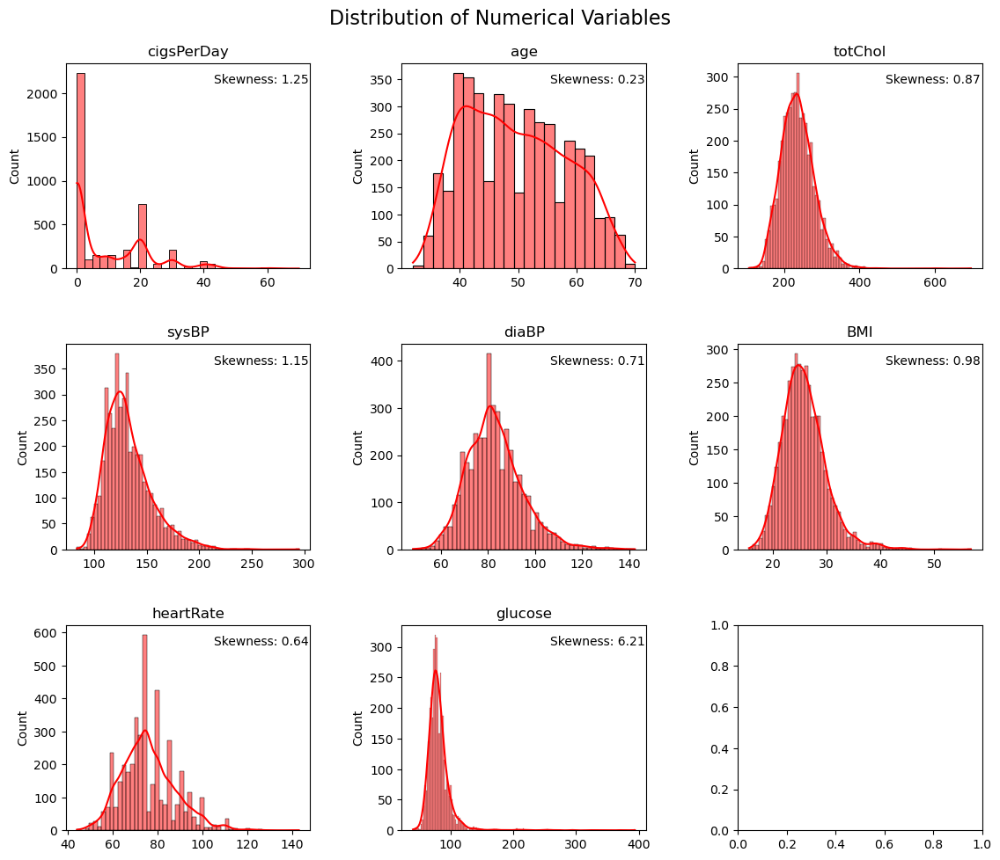

In [27]:
# Create a figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(12, 10))

# Define the numerical columns
numerical_columns = ['cigsPerDay', 'age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose']

# Iterate through each numerical column and plot the distribution
for i, column in enumerate(numerical_columns):
    row = i // 3
    col = i % 3
    
    # Plot histogram
    sns.histplot(heart[column], kde=True, ax=axes[row, col], color='red')
    axes[row, col].set_title(column)
    axes[row, col].set_xlabel('')
    
    # Calculate and display skewness value using pandas
    skewness = heart[column].skew()
    axes[row, col].text(0.8, 0.9, f"Skewness: {skewness:.2f}", transform=axes[row, col].transAxes, ha='center')

# Adjust spacing between subplots
plt.tight_layout(pad=3.0)

# Add a title to the plot
plt.suptitle("Distribution of Numerical Variables", y=1.0, fontsize=16)

# Show the plot
plt.show()

**The histograms reveal notable skewness in several numerical variables, with certain columns, such as 'glucose' and 'cigsPerDay,' exhibiting particularly high degrees of skewness.**

<AxesSubplot:>

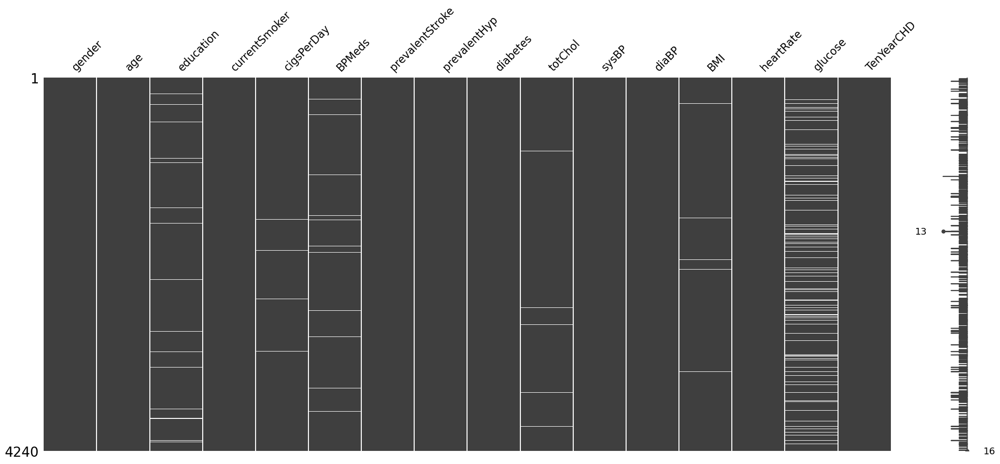

In [28]:
msno.matrix(heart)

**There is no any systematic pattern in missing values**

### Identifying Outliers

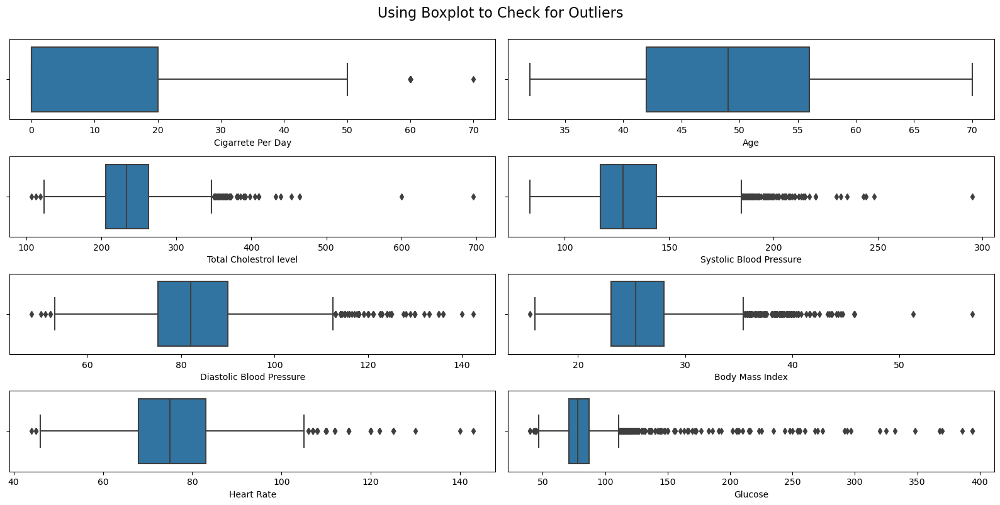

In [29]:
# Set the figure size
plt.figure(figsize=(16, 8))

# Create subplots using the subplot function
plt.subplot(4, 2, 1)
sns.boxplot(heart['cigsPerDay'])
plt.xlabel('Cigarrete Per Day')

plt.subplot(4, 2, 2)
sns.boxplot(heart['age'])
plt.xlabel('Age')

plt.subplot(4, 2, 3)
sns.boxplot(heart['totChol'])
plt.xlabel('Total Cholestrol level')

plt.subplot(4, 2, 4)
sns.boxplot(heart['sysBP'])
plt.xlabel('Systolic Blood Pressure')

plt.subplot(4, 2, 5)
sns.boxplot(heart['diaBP'])
plt.xlabel('Diastolic Blood Pressure')

plt.subplot(4, 2, 6)
sns.boxplot(heart['BMI'])
plt.xlabel('Body Mass Index')

plt.subplot(4, 2, 7)
sns.boxplot(heart['heartRate'])
plt.xlabel('Heart Rate')

plt.subplot(4, 2, 8)
sns.boxplot(heart['glucose'])
plt.xlabel('Glucose')
 

# Adjust the layout and display the plot
plt.suptitle('Using Boxplot to Check for Outliers', y=1.0, fontsize=16)
plt.tight_layout()
plt.show()

**The Boxplot analysis reveals the presence of outliers in all variables, except for the 'Age' variable.** 

## Bivariate Analysis

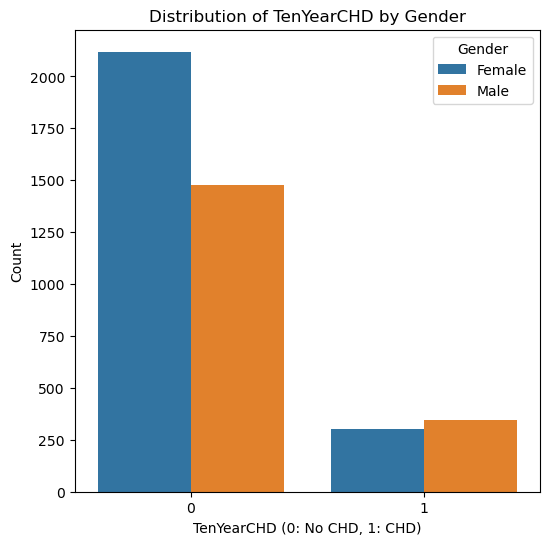

In [30]:
plt.figure(figsize=(6, 6))
sns.countplot(x='TenYearCHD', hue='gender', data= heart)
plt.title('Distribution of TenYearCHD by Gender')
plt.xlabel('TenYearCHD (0: No CHD, 1: CHD)')
plt.ylabel('Count')
plt.legend(title='Gender', labels=['Female', 'Male'])
plt.show()

**The analysis of the clustered bar chart indicates a slightly higher likelihood of developing coronary heart disease after ten years among males as compared to females.**

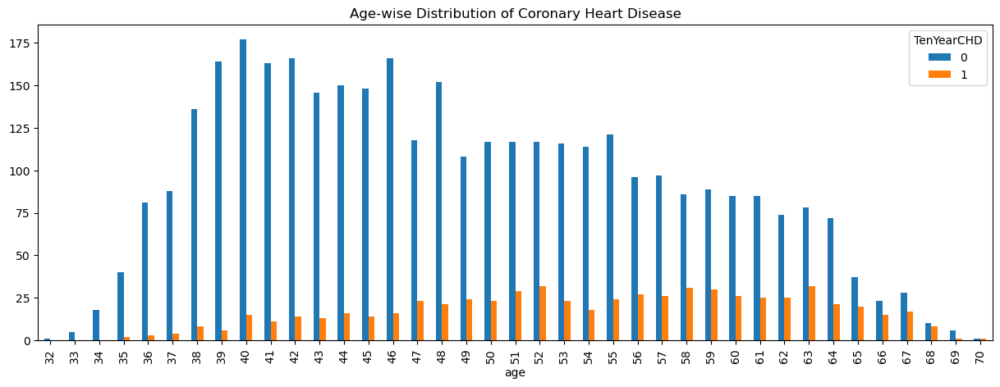

In [31]:
# Set the default figure size
plt.rcParams['figure.figsize'] = (15, 5)

# Group by age and TenYearCHD, then count occurrences and unstack for better visualization
age_effect_count = heart.groupby(['age', 'TenYearCHD']).size().unstack()

# Plot the bar chart
age_effect_count.plot(kind='bar')

# Set the title
plt.title('Age-wise Distribution of Coronary Heart Disease')

# Show the plot
plt.show()

**The data indicates that the onset of Coronary Heart Disease typically begins around the age of 35.**

**As the age increases risk increases.**

In [32]:
fig = px.box(heart, x='TenYearCHD', y='totChol', color='TenYearCHD', category_orders={'TenYearCHD': ['Non_CHD', 'CHD']})

fig.update_layout(
    title='Total Cholestrol level vs Coronary Heart Disease',
    xaxis_title='TenYearCHD',
    yaxis_title='Total Cholestrol level',
    showlegend=False,
    boxmode='group',
    boxgroupgap=0.4,
    boxgap=0.2,
    height=500,
    width=600
)

fig.update_xaxes(
    tickvals=[0, 1],
    ticktext=['Non_CHD', 'CHD']
)

fig.show()

**People having total cholestrol more than 240 are more prone to risk. This feature has some outliers.**

In [33]:
#creat a BMI_category column
heart_1 = heart.copy()
heart_1['BMI_Category'] = pd.cut(heart_1['BMI'], bins=[0, 18.5, 24.9, 29.9, float('inf')], labels=['Underweight', 'Normal', 'Overweight', 'Obesity'])

In [34]:
heart_1.head()

,gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD,BMI_Category
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0,Overweight
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0,Overweight
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0,Overweight
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1,Overweight
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0,Normal


In [35]:
heart_grouped = heart_1.groupby('BMI_Category')['TenYearCHD'].value_counts().unstack().reset_index()

# Create the grouped bar plot
fig = go.Figure()

for outcome in [0, 1]:
    outcome_label = 'Non-CHD' if outcome == 0 else 'CHD'
    fig.add_trace(go.Bar(
        x=heart_grouped['BMI_Category'],
        y=heart_grouped[outcome],
        name=outcome_label
    ))

fig.update_layout(
    xaxis_title='BMI Category',
    yaxis_title='Count',
    title='Coronary Heart Disease by BMI Category',
    barmode='group'
)

fig.show()
print(heart_grouped)

TenYearCHD BMI_Category     0    1
0           Underweight    49    8
1                Normal  1607  226
2            Overweight  1488  290
3               Obesity   443  110


**From the visualization, it is observed that individuals classified as overweight have a higher likelihood of being affected by Coronary Heart Disease.**

In [36]:
fig = px.box(heart, x='TenYearCHD', y='cigsPerDay', color='TenYearCHD', category_orders={'TenYearCHD': ['Non_CHD', 'CHD']})

fig.update_layout(
    title='Cigarrete Per Day vs Coronary Heart Disease',
    xaxis_title='TenYearCHD',
    yaxis_title='Cigarrete Per Day',
    showlegend=False,
    boxmode='group',
    boxgroupgap=0.4,
    boxgap=0.2,
    height=500,
    width=600
)

fig.update_xaxes(
    tickvals=[0, 1],
    ticktext=['Non_CHD', 'CHD']
)

fig.show()

**As per the data, having a low cigsPerDay does not necessarily guarantee a significantly lower risk of Coronary Heart Disease (CHD).**

In [37]:
fig = px.box(heart, x='TenYearCHD', y='sysBP', color='TenYearCHD', category_orders={'TenYearCHD': ['Non_CHD', 'CHD']})

fig.update_layout(
    title='Systolic Blood Pressure vs Coronary Heart Disease',
    xaxis_title='TenYearCHD',
    yaxis_title='Systolic Blood Pressure',
    showlegend=False,
    boxmode='group',
    boxgroupgap=0.4,
    boxgap=0.2,
    height=500,
    width=600
)

fig.update_xaxes(
    tickvals=[0, 1],
    ticktext=['Non_CHD', 'CHD']
)

fig.show()

**People who might have heart disease often have higher systolic blood pressure, around 139 mm Hg or more.**

In [38]:
contingency_table = pd.crosstab(heart_1['BPMeds'], heart_1['TenYearCHD'], margins=True, margins_name="Total")

print(contingency_table)  

TenYearCHD     0    1  Total
BPMeds                      
0.0         3471  592   4063
1.0           83   41    124
Total       3554  633   4187


In [39]:
BP_meds = heart_1[heart_1["BPMeds"] == 1]
heart_grouped = BP_meds.groupby('BPMeds')['TenYearCHD'].value_counts().unstack().reset_index()

# Create the grouped bar plot
fig = go.Figure()

for outcome in [0, 1]:
    outcome_label = 'Non-CHD' if outcome == 0 else 'CHD'
    fig.add_trace(go.Bar(
        x=heart_grouped['BPMeds'],
        y=heart_grouped[outcome],
        name=outcome_label
    ))

fig.update_layout(
    xaxis_title='Use of Blood Pressure Medication',
    yaxis_title='Count',
    title='Coronary Heart Disease by Blood Pressure Medication', width = 600,
    barmode='group'
)

fig.show()

**We have a total of 124 records for people taking blood pressure medication, and out of those, 41 individuals are at risk of heart disease.**

In [40]:
contingency_table = pd.crosstab(heart_1['diabetes'], heart_1['TenYearCHD'], margins=True, margins_name="Total")

print(contingency_table)

TenYearCHD     0    1  Total
diabetes                    
0           3527  604   4131
1             69   40    109
Total       3596  644   4240


In [41]:
diabetes = heart_1[heart_1["diabetes"] == 1]
heart_grouped = diabetes.groupby('diabetes')['TenYearCHD'].value_counts().unstack().reset_index()

# Create the grouped bar plot
fig = go.Figure()

for outcome in [0, 1]:
    outcome_label = 'Non-CHD' if outcome == 0 else 'CHD'
    fig.add_trace(go.Bar(
        x=heart_grouped['diabetes'],
        y=heart_grouped[outcome],
        name=outcome_label
    ))

fig.update_layout(
    xaxis_title='Individuals with Diabetes',
    yaxis_title='Count',
    title='Coronary Heart Disease by Individuals with Diabetes', width = 600,
    barmode='group'
)

fig.show()

In [42]:
heart_1.head(2)

,gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD,BMI_Category
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0,Overweight
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0,Overweight


**We have a total of 109 records for individuals with diabetes, and among them, 40 individuals are at risk of heart disease.**

## Data Preprocessing

### Missing values imputation

In [43]:
heart_1.isnull().sum()

gender               0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
BMI_Category        19
dtype: int64

In [44]:
heart_2 = heart_1.drop('education', axis=1)

In [45]:
heart_missing = heart_2[["age","cigsPerDay", "totChol", "BMI", "heartRate", "glucose","sysBP", "diaBP"]]

In [46]:
heart_missing.isnull().sum()

age             0
cigsPerDay     29
totChol        50
BMI            19
heartRate       1
glucose       388
sysBP           0
diaBP           0
dtype: int64

### 1. Using KNN Imputation technique

In [47]:
# Create a KNNImputer object
knn_imputer = KNNImputer(n_neighbors=5)

# Perform KNN imputation on the DataFrame
df_imputed = pd.DataFrame(knn_imputer.fit_transform(heart_missing), columns=heart_missing.columns)

In [48]:
df_imputed.isnull().sum()

age           0
cigsPerDay    0
totChol       0
BMI           0
heartRate     0
glucose       0
sysBP         0
diaBP         0
dtype: int64

### 2. Using MICE Imputation technique

In [49]:
# Initialize the IterativeImputer object
mice_imputer = IterativeImputer()

# Perform MICE imputation
heart_imputed_mice = pd.DataFrame(mice_imputer.fit_transform(heart_missing), columns = heart_missing.columns)

In [50]:
heart_imputed_mice.isnull().sum()

age           0
cigsPerDay    0
totChol       0
BMI           0
heartRate     0
glucose       0
sysBP         0
diaBP         0
dtype: int64

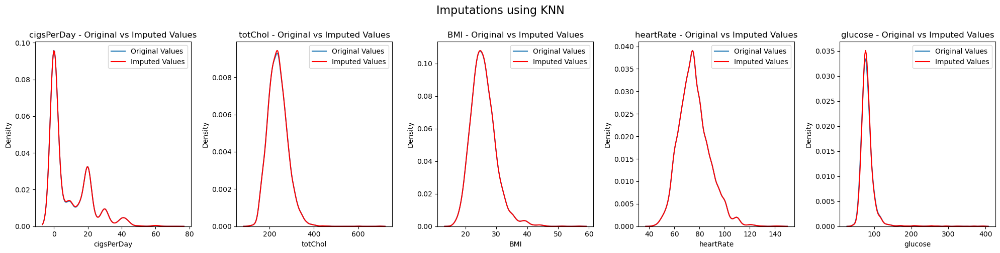

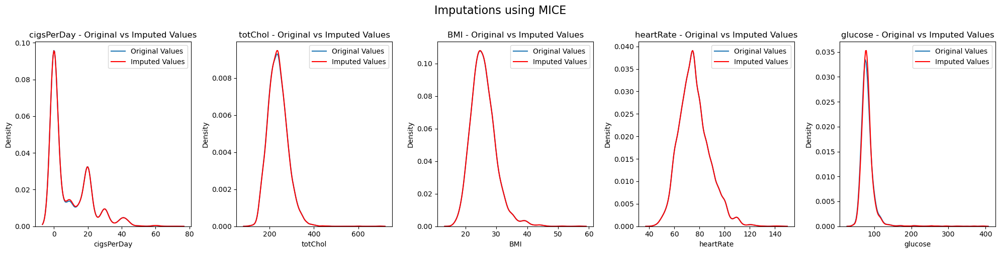

In [51]:
variables_with_missing = ["cigsPerDay", "totChol", "BMI", "heartRate", "glucose"]
# Create subplots for all variables
fig, axes = plt.subplots(1, len(variables_with_missing), figsize=(20, 5))

# Loop through variables and create density plots
plt.title("Missing value Imputation using KNN")
for i, variable in enumerate(variables_with_missing):
    sns.kdeplot(heart_missing[variable], ax=axes[i], label='Original Values')
    sns.kdeplot(df_imputed[variable], ax=axes[i], label='Imputed Values', color='red')
    axes[i].set_xlabel(variable)
    axes[i].set_ylabel('Density')
    axes[i].set_title(f'{variable} - Original vs Imputed Values')
    axes[i].legend()
    
plt.suptitle("Imputations using KNN", y=1.0, fontsize=16)

# Adjust spacing between subplots
plt.tight_layout()

# Create subplots for all variables
fig, axes = plt.subplots(1, len(variables_with_missing), figsize=(20, 5))

# Loop through variables and create density plots
for i, variable in enumerate(variables_with_missing):
    sns.kdeplot(heart_missing[variable], ax=axes[i], label='Original Values')
    sns.kdeplot(heart_imputed_mice[variable], ax=axes[i], label='Imputed Values', color='red')
    axes[i].set_xlabel(variable)
    axes[i].set_ylabel('Density')
    axes[i].set_title(f'{variable} - Original vs Imputed Values')
    axes[i].legend()

plt.suptitle("Imputations using MICE", y=1.0, fontsize=16)

# Adjust spacing between subplots
plt.tight_layout()

**After Comparing both the statistical measures and the distributions, I found that KNN Imputer has provided better results.**

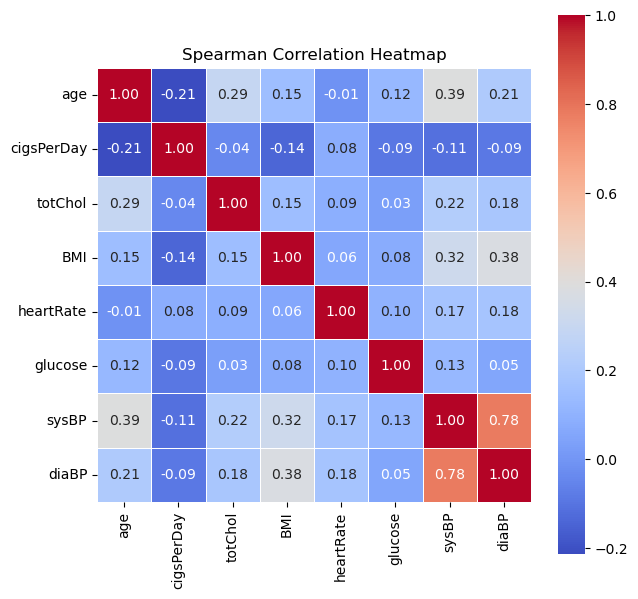

In [52]:
# Calculate the Spearman correlation matrix
correlation_matrix_spearman = df_imputed.corr(method='spearman')

# Set up the matplotlib figure
plt.figure(figsize=(7, 7))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix_spearman, annot=True, cmap='coolwarm', fmt='.2f',
            linewidths=0.5, square=True)

# Set the title of the heatmap
plt.title('Spearman Correlation Heatmap')

# Show the plot
plt.show()

- sysBP and diaBP shows postive correlation

In [53]:
# merging the dataframe with imputed dataset
categorical_col = heart_2[["gender", "currentSmoker", "BPMeds","prevalentStroke", "prevalentHyp", "diabetes", "TenYearCHD"]]
heart_new = pd.concat([df_imputed, categorical_col], axis=1)

In [54]:
heart_new.head(2)

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD
0,39.0,0.0,195.0,26.97,80.0,77.0,106.0,70.0,1,0,0.0,0,0,0,0
1,46.0,0.0,250.0,28.73,95.0,76.0,121.0,81.0,0,0,0.0,0,0,0,0


In [55]:
# dropping missing values from BPMeds as it is categorical variable
heart_new.dropna(inplace=True)

In [56]:
#creat a BMI_category column
heart_new['BMI_Category'] = pd.cut(heart_new['BMI'], bins=[0, 18.5, 24.9, 29.9, float('inf')], labels=['Underweight', 'Normal', 'Overweight', 'Obesity'])

In [57]:
heart_new['chol_category'] = pd.cut(heart_new['totChol'],
                             bins=[-float('inf'), 200, 239, float('inf')],
                             labels=['Desirable', 'Borderline High', 'High'],
                             right=False)

In [58]:
heart_grouped = heart_new.groupby('chol_category')['TenYearCHD'].value_counts().unstack().reset_index()

# Create the grouped bar plot
fig = go.Figure()

for outcome in [0, 1]:
    outcome_label = 'Non-CHD' if outcome == 0 else 'CHD'
    fig.add_trace(go.Bar(
        x=heart_grouped['chol_category'],
        y=heart_grouped[outcome],
        name=outcome_label
    ))

fig.update_layout(
    xaxis_title='Total Cholestrol level by Categories',
    yaxis_title='Count',
    title='Coronary Heart Disease by Cholestrol level Category',
    barmode='group', width = 700, height = 450
)

fig.show()

**We can see the bar plot, it is evident that individuals with high cholesterol levels are more likely to have heart disease.**

### Multivariate Analysis

In [59]:
fig = px.box(heart_new, x='BMI_Category', y='age', color='TenYearCHD',
             category_orders={'Outcome': [0, 1]}, color_discrete_sequence=['blue', 'red'],
             labels={'TenYearCHD': 'Heart Disease', 'BMI_Category': 'BMI Category'})

fig.update_layout(
    title='Age Distribution by BMI Category with Heart Disease',
    xaxis_title='BMI Category',
    yaxis_title='Age',
    legend_title='Heart Disease',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1,
                itemsizing='constant'),
)

fig.for_each_trace(lambda t: t.update(name='Non-CHD' if t.name == '0' else 'CHD'))

fig.show()

**Individuals in the obese category usually develop heart disease later in life, typically around the age of 57.**

In [60]:
fig = px.scatter(
    heart_new,
    x='sysBP',
    y='diaBP',
    color='TenYearCHD',
    labels={'sysBP': 'Systolic Blood Pressure', 'diaBP': 'Diastolic Blood Pressure', 'TenYearCHD': 'TenYearCHD'},
    title='Scatter Plot of Systolic vs. Diastolic Blood Pressure',
)

# Show the plot
fig.show()

**The data indicates a positive correlation, signifying that an increase in systolic blood pressure is accompanied by a corresponding rise in diastolic blood pressure, and this trend is associated with an elevated likelihood of heart disease.**

In [61]:
fig = px.box(heart_new, x='diabetes', y='glucose', color='TenYearCHD', 
             category_orders={'TenYearCHD': [0,1]},
             labels={'TenYearCHD': 'Ten Year CHD', 'totChol': 'Total Cholesterol', 'prevalentHyp': 'Prevalent Hypertension'})

# Update layout for better readability
fig.update_layout(
    title='Box Plot of Glucose Levels by Ten-Year Coronary Heart Disease and Diabetes',
    xaxis_title='Ten Year CHD',
    yaxis_title='Glucose',
    legend_title='Ten Year CHD'
)

# Show the plot
fig.show()

**Individuals with diabetes and higher glucose levels exhibit a higher likelihood of being affected by heart disease.**

### Outliers treatment

In [62]:
# Create subplots with 4 rows and 2 columns
fig = make_subplots(rows=4, cols=2, subplot_titles=[
    'Cigarettes Per Day', 'Age', 'Total Cholesterol Level',
    'Systolic Blood Pressure', 'Diastolic Blood Pressure',
    'Body Mass Index', 'Heart Rate', 'Glucose'
])

# Add boxplots to each subplot
fig.add_trace(go.Box(x=heart_new['cigsPerDay']), row=1, col=1)
fig.add_trace(go.Box(x=heart_new['age']), row=1, col=2)
fig.add_trace(go.Box(x=heart_new['totChol']), row=2, col=1)
fig.add_trace(go.Box(x=heart_new['sysBP']), row=2, col=2)
fig.add_trace(go.Box(x=heart_new['diaBP']), row=3, col=1)
fig.add_trace(go.Box(x=heart_new['BMI']), row=3, col=2)
fig.add_trace(go.Box(x=heart_new['heartRate']), row=4, col=1)
fig.add_trace(go.Box(x=heart_new['glucose']), row=4, col=2)

# Update layout for better readability
fig.update_layout(
    title='Using Boxplot to Check for Outliers',
    height=800,
    showlegend=False  # Set to True if you want to display legends
)

# Show the plot
fig.show()

**1. Transformation**

In [63]:
# Select numerical columns for transformation
numerical_column = ['cigsPerDay']

# Create a new DataFrame for transformed data
heart_transformed = heart_new.copy()

# Initialize the PowerTransformer
pt = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit and transform the selected numerical columns
heart_transformed[numerical_column] = pt.fit_transform(heart_transformed[numerical_column])

<AxesSubplot:xlabel='cigsPerDay'>

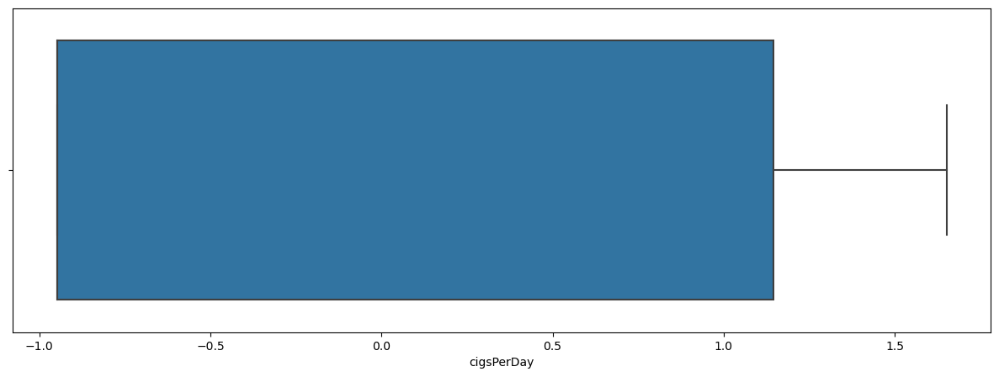

In [64]:
sns.boxplot(heart_transformed['cigsPerDay'])

### Outlier treatment for Total cholestrol

In [65]:
# Finding the IQR
percentile_25_chol = heart_new['totChol'].quantile(0.25)
percentile_75_chol = heart_new['totChol'].quantile(0.75)

# Calculating IQR
iqr_chol = percentile_75_chol - percentile_25_chol

# Calculating upper_bound & lower_bound 
upper_bound_chol = percentile_75_chol + 1.5 * iqr_chol
lower_bound_chol = percentile_25_chol - 1.5 * iqr_chol

print("Upper bound",upper_bound_chol)
print("Lower bound",lower_bound_chol)

Upper bound 348.5
Lower bound 120.5


In [66]:
heart_transformed[heart_transformed['totChol'] > upper_bound_chol]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category
194,42.0,-0.948080,464.0,22.90,72.0,72.0,128.0,87.0,0,0,0.0,0,0,0,1,Normal,High
259,60.0,-0.948080,352.0,36.29,75.0,95.0,197.5,105.0,0,0,0.0,0,1,0,1,Obesity,High
333,55.0,-0.948080,368.0,25.20,100.0,81.0,204.0,94.0,0,0,1.0,0,1,0,0,Overweight,High
533,53.0,-0.948080,370.0,24.64,63.0,74.0,123.0,83.0,0,0,0.0,0,0,0,1,Normal,High
543,47.0,1.097072,439.0,22.42,100.0,90.0,145.0,74.0,1,1,0.0,0,1,0,1,Normal,High
617,51.0,0.186124,398.0,23.63,77.0,83.0,161.0,96.0,0,1,0.0,0,1,0,0,Normal,High
670,65.0,-0.948080,355.0,28.38,75.0,108.0,138.0,79.0,0,0,0.0,0,0,0,0,Overweight,High
920,60.0,1.011798,353.0,22.66,85.0,71.0,116.0,82.0,0,1,0.0,0,0,0,0,Normal,High
926,61.0,1.145211,360.0,28.74,95.0,73.0,157.0,99.0,1,1,0.0,0,1,0,0,Overweight,High
1103,60.0,1.145211,352.0,25.96,80.0,79.0,149.0,73.0,0,1,0.0,0,1,0,0,Overweight,High


In [67]:
heart_transformed['totChol'].describe()

count    4187.000000
mean      236.671459
std        44.265351
min       107.000000
25%       206.000000
50%       234.000000
75%       263.000000
max       696.000000
Name: totChol, dtype: float64

In [68]:
heart_transformed[heart_transformed['totChol'] < lower_bound_chol]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category
1624,70.0,-0.948080,107.0,27.304,68.0,62.0,143.0,93.0,0,0,0.0,1,1,0,1,Overweight,Desirable
2525,38.0,1.145211,113.0,30.340,78.0,85.0,120.0,83.5,1,1,0.0,0,0,0,0,Obesity,Desirable
4066,47.0,1.145211,119.0,26.400,75.0,78.0,117.0,78.5,1,1,0.0,0,0,0,0,Overweight,Desirable


In [69]:
heart_transformed.shape

(4187, 17)

### Binning

In [70]:
# Define bin edges
bin_edges = [0, 140, 240, 300, 365, float('inf')]

# Define bin edges and labels
bin_labels = ['0-140', '141-240', '241-300', '301-365', '365+']

# Create a new column 'cholesterol_category' with bin labels
heart_transformed['cholesterol_category'] = pd.cut(heart_transformed['totChol'], bins=bin_edges, labels=bin_labels, include_lowest=True)

In [71]:
heart_transformed.head()

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category
0,39.0,-0.948080,195.0,26.97,80.0,77.0,106.0,70.0,1,0,0.0,0,0,0,0,Overweight,Desirable,141-240
1,46.0,-0.948080,250.0,28.73,95.0,76.0,121.0,81.0,0,0,0.0,0,0,0,0,Overweight,High,241-300
2,48.0,1.145211,245.0,25.34,75.0,70.0,127.5,80.0,1,1,0.0,0,0,0,0,Overweight,High,241-300
3,61.0,1.322379,225.0,28.58,65.0,103.0,150.0,95.0,0,1,0.0,0,1,0,1,Overweight,Borderline High,141-240
4,46.0,1.207743,285.0,23.10,85.0,85.0,130.0,84.0,0,1,0.0,0,0,0,0,Normal,High,241-300


In [72]:
# Create a box plot with smaller bins using Plotly
fig = px.box(heart_transformed, x='cholesterol_category', y='totChol', width=800, height=500)

# Adjust layout
fig.update_layout(
    title='Box Plot of Total Cholesterol by Cholesterol Category',
    xaxis_title='Cholesterol Category',
    yaxis_title='Total Cholesterol'
)

# Show the plot
fig.show()

In [73]:
# drop error values
heart_transformed.drop([1111, 3160], inplace = True)
heart_new.drop([1111, 3160], inplace = True)# 3160  1111

### Ordinal encoding

In [74]:
# Define a mapping for intervals to numerical labels
interval_mapping = {'0-140': 0, '141-240': 1, '241-300': 2, '301-365': 3, '365+': 4}

# Map the intervals to numerical labels
heart_transformed['totCholestrol_encoded'] = heart_transformed['cholesterol_category'].map(interval_mapping)

In [75]:
# convert totCholestrol_encoded variable into a DataFrame
heart_transformed['totCholestrol_encoded'] = pd.DataFrame(heart_transformed['totCholestrol_encoded'])

In [76]:
heart_transformed.tail(2)

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded
4238,40.0,-0.948080,185.0,25.60,67.0,72.0,141.0,98.0,1,0,0.0,0,1,0,0,Overweight,Desirable,141-240,1
4239,39.0,1.322379,196.0,20.91,85.0,80.0,133.0,86.0,0,1,0.0,0,0,0,0,Normal,Desirable,141-240,1


### Outlier treatment for Systolic Blood Pressure

In [77]:
# Finding the IQR
percentile_25_sysBP = heart_new['sysBP'].quantile(0.25)
percentile_75_sysBP = heart_new['sysBP'].quantile(0.75)

# Calculating IQR
iqr_sysBP = percentile_75_sysBP - percentile_25_sysBP

# Calculating upper_bound & lower_bound 
upper_bound_sysBP = percentile_75_sysBP + 1.5 * iqr_sysBP
lower_bound_sysBP = percentile_25_sysBP - 1.5 * iqr_sysBP

print("Upper bound",upper_bound_sysBP)
print("Lower bound",lower_bound_sysBP)

Upper bound 183.25
Lower bound 77.25


In [78]:
heart_new[heart_new['sysBP'] > upper_bound_sysBP]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category
44,53.0,0.0,311.0,21.51,76.0,215.0,206.0,92.0,0,0,1.0,0,1,1,1,Normal,High
66,62.0,0.0,212.0,29.64,100.0,202.0,190.0,99.0,0,0,0.0,0,1,1,0,Overweight,Borderline High
87,61.0,1.0,326.0,38.46,57.0,78.0,200.0,104.0,0,1,0.0,0,1,0,0,Obesity,High
108,66.0,0.0,278.0,40.52,90.0,84.0,187.0,88.0,0,0,0.0,0,1,0,1,Obesity,High
153,66.0,0.0,214.0,25.32,57.0,84.0,212.0,104.0,0,0,0.0,0,1,0,1,Overweight,Borderline High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4123,51.0,0.0,268.0,26.35,98.0,70.0,206.0,116.0,1,0,0.0,0,1,0,1,Overweight,High
4173,54.0,0.0,302.0,31.98,68.0,79.0,210.0,127.5,0,0,0.0,0,1,0,0,Obesity,High
4193,63.0,0.0,306.0,27.96,75.0,87.0,195.0,105.0,0,0,0.0,0,1,0,1,Overweight,High
4222,53.0,0.0,289.0,26.70,70.0,63.0,188.0,110.0,1,0,0.0,0,1,0,0,Overweight,High


In [79]:
# Select numerical columns for transformation
numerical_column = ['sysBP']

# Initialize the PowerTransformer
pt = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit and transform the selected numerical columns
heart_transformed[numerical_column] = pt.fit_transform(heart_new[numerical_column])

In [80]:
# Finding the IQR
percentile_25_sysBP = heart_transformed['sysBP'].quantile(0.25)
percentile_75_sysBP = heart_transformed['sysBP'].quantile(0.75)

# Calculating IQR
iqr_sysBP = percentile_75_sysBP - percentile_25_sysBP

# Calculating upper_bound & lower_bound 
upper_bound_sysBP = percentile_75_sysBP + 1.5 * iqr_sysBP
lower_bound_sysBP = percentile_25_sysBP - 1.5 * iqr_sysBP

print("Upper bound",upper_bound_sysBP)
print("Lower bound",lower_bound_sysBP)

Upper bound 2.715527911788528
Lower bound -2.7054897929078585


In [81]:
heart_transformed[heart_transformed['sysBP'] > upper_bound_sysBP]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded
481,64.0,-0.948080,253.0,38.820,92.0,70.0,3.399384,135.0,0,0,0.0,0,1,0,1,Obesity,High,241-300,2
864,59.0,-0.948080,264.0,19.610,76.0,120.0,2.909225,124.0,0,0,1.0,0,1,0,1,Normal,High,241-300,2
1189,48.0,-0.948080,169.0,28.490,85.0,77.0,2.897225,142.5,0,0,0.0,0,1,0,0,Overweight,Desirable,141-240,1
1989,61.0,-0.948080,238.0,24.830,75.0,79.0,2.757336,136.0,1,0,0.0,0,1,0,0,Normal,Borderline High,141-240,1
2091,65.0,-0.948080,240.0,29.916,68.0,297.0,2.796982,100.0,1,0,0.0,0,1,1,1,Obesity,High,141-240,1
3489,62.0,-0.948080,298.0,37.100,96.0,77.0,2.956115,130.0,0,0,1.0,0,1,0,1,Obesity,High,241-300,2
3616,54.0,1.011798,262.0,24.760,93.0,97.0,2.730243,110.0,0,1,0.0,0,1,0,0,Normal,High,241-300,2


In [82]:
heart_transformed[heart_transformed['sysBP'] < lower_bound_sysBP]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded
420,46.0,-0.948080,232.0,19.20,60.0,82.0,-3.029638,60.0,0,0,0.0,0,0,0,0,Normal,Borderline High,141-240,1
1685,53.0,-0.948080,225.0,24.17,56.0,68.0,-2.800258,69.0,0,0,0.0,0,0,0,0,Normal,Borderline High,141-240,1
1997,58.0,-0.948080,260.0,20.76,87.0,206.0,-3.590815,51.0,0,0,0.0,0,0,1,1,Normal,High,241-300,2
2422,34.0,0.813813,159.0,22.15,65.0,68.0,-2.744680,70.0,0,1,0.0,0,0,0,0,Normal,Desirable,141-240,1
2665,58.0,1.011798,175.0,29.66,95.0,115.0,-3.862492,58.0,1,1,0.0,0,0,0,0,Overweight,Desirable,141-240,1
2894,38.0,0.760682,224.0,18.18,75.0,57.0,-3.029638,70.0,0,1,0.0,0,0,0,0,Underweight,Borderline High,141-240,1
3487,35.0,1.145211,168.0,16.71,79.0,63.0,-3.862492,55.0,0,1,0.0,0,0,0,1,Underweight,Desirable,141-240,1
3578,39.0,1.145211,190.0,22.43,88.0,60.0,-3.657367,70.0,0,1,0.0,0,0,0,0,Normal,Desirable,141-240,1
3918,63.0,-0.948080,316.0,23.10,62.0,76.0,-2.744680,66.5,0,0,0.0,0,0,0,1,Normal,High,301-365,3


In [83]:
heart_transformed.drop([420,1685,1997,2422,2665,2894,3487, 3578, 3918,3616,3489,2091,1989,1189,481,864], inplace=True)
#heart_new.drop([1111,3160], inplace=True)

In [84]:
fig = px.box(heart_transformed, y='sysBP', title='Box Plot of Transformed sysBP')
fig.show()

### Outliers treatment for Diastolic Blood Pressure

In [85]:
# Finding the IQR
percentile_25_diaBP = heart_transformed['diaBP'].quantile(0.25)
percentile_75_diaBP = heart_transformed['diaBP'].quantile(0.75)

# Calculating IQR
iqr_diaBP = percentile_75_diaBP  - percentile_25_diaBP

# Calculating upper_bound & lower_bound 
upper_bound_diaBP = percentile_75_diaBP  + 1.5 * iqr_diaBP 
lower_bound_diaBP = percentile_25_diaBP - 1.5 * iqr_diaBP 

print("Upper bound",upper_bound_diaBP)
print("Lower bound",lower_bound_diaBP)

Upper bound 111.25
Lower bound 53.25


In [86]:
heart_transformed[heart_transformed['diaBP'] > upper_bound_diaBP]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded
28,61.0,-0.948080,272.0,32.80,85.0,65.0,1.869465,121.0,0,0,0.0,0,1,0,1,Obesity,High,241-300,2
46,65.0,-0.948080,252.0,30.47,90.0,87.0,1.809954,114.0,0,0,0.0,0,1,0,0,Obesity,High,241-300,2
158,49.0,-0.948080,254.0,28.35,78.0,54.0,2.068970,124.5,0,0,1.0,0,1,0,0,Overweight,High,241-300,2
249,60.0,1.145211,180.0,44.27,88.0,150.0,2.247991,122.5,0,1,0.0,0,0,1,0,Obesity,Desirable,141-240,1
359,51.0,1.322379,230.0,25.08,95.0,88.0,1.592590,112.0,1,1,0.0,0,1,0,1,Overweight,Borderline High,141-240,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4075,63.0,1.244320,203.0,26.18,80.0,83.0,2.100144,125.0,1,1,0.0,0,1,0,1,Overweight,Borderline High,141-240,1
4076,61.0,-0.948080,265.0,29.50,68.0,256.0,2.247991,125.0,0,0,1.0,0,1,1,1,Overweight,High,241-300,2
4123,51.0,-0.948080,268.0,26.35,98.0,70.0,2.357405,116.0,1,0,0.0,0,1,0,1,Overweight,High,241-300,2
4173,54.0,-0.948080,302.0,31.98,68.0,79.0,2.426370,127.5,0,0,0.0,0,1,0,0,Obesity,High,301-365,3


In [87]:
fig = px.box(heart_transformed, y='diaBP', title='Box Plot of Transformed diaBP')
fig.show()

### Bining

In [88]:
# Define refined bin edges
refined_bin_edges = [35, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, float('inf')]

# Define bin labels
bin_labels = ['35-45', '46-50', '51-55', '56-60', '61-65', '66-70', '71-75', '76-80', '81-85', '86-90', '91-95', '96-100', '101-105', '106-110', '111-115', '116-120', '120+']

# Create a new column 'diaBP_category' with refined bin labels
heart_transformed['diaBP_category_refined'] = pd.cut(heart_transformed['diaBP'], bins=refined_bin_edges, labels=bin_labels, include_lowest=True)

In [89]:
# Define the order of categories for sorting
category_order = ['35-45', '46-50', '51-55', '56-60', '61-65', '66-70', '71-75', '76-80', '81-85', '86-90', '91-95', '96-100', '101-105', '106-110', '111-115', '116-120', '120+']
# Create a box plot with smaller bins using Plotly
fig = px.box(heart_transformed, x='diaBP_category_refined', y='diaBP', width=800, height=500, category_orders={'diaBP_category_refined': category_order})

# Adjust layout
fig.update_layout(
    title='Box Plot of Diastolic BP by DiaBP Category',
    xaxis_title='Diastolic Blood Pressure Category',
    yaxis_title='Diastolic Blood Pressure'
)

# Show the plot
fig.show()

In [90]:
# Your category order
bin_labels = ['35-45', '46-50', '51-55', '56-60', '61-65', '66-70', '71-75', '76-80', '81-85', '86-90', '91-95', '96-100', '101-105', '106-110', '111-115', '116-120', '120+']

# Assuming 'diaBP_category_refined' is a column in the DataFrame 'heart_transformed'
# Extract the column and reshape it to a 2D array
diaBP_categories = heart_transformed['diaBP_category_refined'].values.reshape(-1, 1)

# Create an instance of the OrdinalEncoder
encoder = OrdinalEncoder(categories=[bin_labels])

# Fit and transform the data
encoded_data = encoder.fit_transform(diaBP_categories)

# Add a new column 'diaBP_encoded' to the DataFrame with the encoded values
heart_transformed['diaBP_encoded'] = encoded_data.astype('int')

### Outlier treatment for BMI

In [91]:
# Finding the IQR
percentile_25_BMI = heart_transformed['BMI'].quantile(0.25)
percentile_75_BMI = heart_transformed['BMI'].quantile(0.75)

# Calculating IQR
iqr_BMI = percentile_75_BMI  - percentile_25_BMI

# Calculating upper_bound & lower_bound 
upper_bound_BMI = percentile_75_BMI  + 1.5 * iqr_BMI
lower_bound_BMI = percentile_25_BMI - 1.5 * iqr_BMI

print("Upper bound",upper_bound_BMI)
print("Lower bound",lower_bound_BMI)

Upper bound 35.480000000000004
Lower bound 15.639999999999997


In [92]:
heart_transformed[heart_transformed['BMI'] > upper_bound_BMI]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded
35,37.0,-0.94808,225.0,38.53,95.0,83.0,-0.221742,92.5,1,0,...,0,1,0,0,Obesity,Borderline High,141-240,1,91-95,10
37,52.0,-0.94808,178.0,40.11,75.0,225.0,1.271580,98.0,1,0,...,0,1,1,0,Obesity,Desirable,141-240,1,96-100,11
78,45.0,-0.94808,183.0,45.80,80.0,63.0,0.968650,101.0,0,0,...,0,1,0,0,Obesity,Desirable,141-240,1,101-105,12
87,61.0,-0.33606,326.0,38.46,57.0,78.0,2.247991,104.0,0,1,...,0,1,0,0,Obesity,High,301-365,3,101-105,12
108,66.0,-0.94808,278.0,40.52,90.0,84.0,1.983023,88.0,0,0,...,0,1,0,1,Obesity,High,241-300,2,86-90,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4001,58.0,-0.94808,385.0,41.66,82.0,91.0,1.423585,95.0,0,0,...,0,1,0,0,Obesity,High,365+,4,91-95,10
4132,57.0,-0.94808,259.0,38.17,85.0,75.0,1.565372,101.0,0,0,...,0,1,0,0,Obesity,High,241-300,2,101-105,12
4190,41.0,-0.94808,229.0,36.07,75.0,92.0,0.932408,89.0,0,0,...,0,1,0,0,Obesity,Borderline High,141-240,1,86-90,9
4215,63.0,-0.94808,236.0,39.17,78.0,79.0,1.108269,82.0,0,0,...,0,1,1,0,Obesity,Borderline High,141-240,1,81-85,8


In [93]:
heart_transformed[heart_transformed['BMI'] < lower_bound_BMI]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded
377,67.0,-0.94808,203.0,15.54,96.0,79.0,-0.364984,74.0,1,0,...,0,0,0,0,Underweight,Borderline High,141-240,1,71-75,6


In [94]:
heart_transformed['BMI_Category'].unique()

['Overweight', 'Normal', 'Obesity', 'Underweight']
Categories (4, object): ['Underweight' < 'Normal' < 'Overweight' < 'Obesity']

In [95]:
# Define a mapping for intervals to numerical labels
interval_mapping = {'Underweight': 0, 'Normal': 1, 'Overweight': 2, 'Obesity': 3}

# Map the intervals to numerical labels
heart_transformed['BMI_category_encoded'] = heart_transformed['BMI_Category'].map(interval_mapping)

In [96]:
heart_transformed['BMI_category_encoded'] = pd.DataFrame(heart_transformed['BMI_category_encoded']) 

In [97]:
heart_transformed.head(2)

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded,BMI_category_encoded
0,39.0,-0.94808,195.0,26.97,80.0,77.0,-1.467715,70.0,1,0,...,0,0,0,Overweight,Desirable,141-240,1,66-70,5,2
1,46.0,-0.94808,250.0,28.73,95.0,76.0,-0.424183,81.0,0,0,...,0,0,0,Overweight,High,241-300,2,81-85,8,2


### Outlier treatment for Heart rate

In [98]:
# Finding the IQR
percentile_25_hRate = heart_transformed['heartRate'].quantile(0.25)
percentile_75_hRate = heart_transformed['heartRate'].quantile(0.75)

# Calculating IQR
iqr_hRate = percentile_75_hRate  - percentile_25_hRate

# Calculating upper_bound & lower_bound 
upper_bound_hRate = percentile_75_hRate  + 1.5 * iqr_hRate
lower_bound_hRate = percentile_25_hRate - 1.5 * iqr_hRate

print("Upper bound",upper_bound_hRate)
print("Lower bound",lower_bound_hRate)

Upper bound 105.5
Lower bound 45.5


In [99]:
heart_transformed[heart_transformed['heartRate'] > upper_bound_hRate]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded,BMI_category_encoded
162,47.0,-0.948080,174.0,26.15,110.0,86.0,-0.608692,86.5,0,0,...,0,0,0,Overweight,Desirable,141-240,1,86-90,9,2
270,54.0,-0.948080,273.0,29.06,110.0,73.0,0.493959,98.0,0,0,...,1,0,1,Overweight,High,241-300,2,96-100,11,2
339,64.0,-0.948080,312.0,27.59,140.0,94.0,1.271580,82.0,0,0,...,1,0,0,Overweight,High,301-365,3,81-85,8,2
358,40.0,1.145211,210.0,21.21,130.0,84.0,-0.608692,79.0,0,1,...,0,0,0,Normal,Borderline High,141-240,1,76-80,7,1
382,53.0,-0.948080,174.0,27.45,108.0,96.0,1.423585,93.0,0,0,...,1,0,0,Overweight,Desirable,141-240,1,91-95,10,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3957,41.0,1.440164,254.0,27.68,110.0,70.8,0.579525,100.0,1,1,...,0,0,1,Overweight,High,241-300,2,96-100,11,2
3964,39.0,-0.948080,213.0,16.73,110.0,75.0,-0.193880,87.0,0,0,...,0,0,0,Underweight,Borderline High,141-240,1,86-90,9,0
4053,44.0,-0.948080,160.0,18.63,125.0,78.0,-1.387673,69.0,0,0,...,0,0,0,Normal,Desirable,141-240,1,66-70,5,1
4070,40.0,-0.948080,202.0,28.35,125.0,80.0,1.207678,103.0,0,0,...,1,0,0,Overweight,Borderline High,141-240,1,101-105,12,2


In [100]:
heart_transformed[heart_transformed['heartRate'] < lower_bound_hRate]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,prevalentHyp,diabetes,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded,BMI_category_encoded
1233,59.0,-0.948080,229.0,25.18,44.0,81.0,-1.940692,66.0,1,0,...,0,0,0,Overweight,Borderline High,141-240,1,66-70,5,2
1844,35.0,1.011798,196.0,22.64,45.0,79.0,-1.348291,66.5,1,1,...,0,0,0,Normal,Desirable,141-240,1,66-70,5,1
3740,36.0,-0.948080,230.0,26.53,45.0,78.0,-0.364984,78.0,1,0,...,0,0,0,Overweight,Borderline High,141-240,1,76-80,7,2


In [101]:
heart_transformed['heartRate']

0       80.0
1       95.0
2       75.0
3       65.0
4       85.0
        ... 
4234    65.0
4236    86.0
4237    80.0
4238    67.0
4239    85.0
Name: heartRate, Length: 4169, dtype: float64

In [102]:
# Define bin edges
bin_edges = [0, 80, 100, 120, np.inf]

# Define bin labels
bin_labels = ['Low', 'Medium', 'High', 'Very High']

# Create a new column 'HeartRateCategory' with bin labels
heart_transformed['HeartRateCategory'] = pd.cut(heart_transformed['heartRate'], bins=bin_edges, labels=bin_labels, right=False)

In [103]:
# Define a mapping for intervals to numerical labels
interval_mapping = {'Low': 0, 'Medium': 1, 'High': 2, 'Very High': 3}


# Map the intervals to numerical labels
heart_transformed['heartRate_category_encoded'] = heart_transformed['HeartRateCategory'].map(interval_mapping)

In [104]:
heart_transformed['heartRate_category_encoded'] = pd.DataFrame(heart_transformed['heartRate_category_encoded'])

In [105]:
heart_transformed.head()

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded,BMI_category_encoded,HeartRateCategory,heartRate_category_encoded
0,39.0,-0.948080,195.0,26.97,80.0,77.0,-1.467715,70.0,1,0,...,0,Overweight,Desirable,141-240,1,66-70,5,2,Medium,1
1,46.0,-0.948080,250.0,28.73,95.0,76.0,-0.424183,81.0,0,0,...,0,Overweight,High,241-300,2,81-85,8,2,Medium,1
2,48.0,1.145211,245.0,25.34,75.0,70.0,-0.058316,80.0,1,1,...,0,Overweight,High,241-300,2,76-80,7,2,Low,0
3,61.0,1.322379,225.0,28.58,65.0,103.0,0.932408,95.0,0,1,...,1,Overweight,Borderline High,141-240,1,91-95,10,2,Low,0
4,46.0,1.207743,285.0,23.10,85.0,85.0,0.071290,84.0,0,1,...,0,Normal,High,241-300,2,81-85,8,1,Medium,1


### Outlier treatment for glucose

In [106]:
# Finding the IQR
percentile_25_glucose = heart_transformed['glucose'].quantile(0.25)
percentile_75_glucose = heart_transformed['glucose'].quantile(0.75)

# Calculating IQR
iqr_glucose = percentile_75_glucose  - percentile_25_glucose

# Calculating upper_bound & lower_bound 
upper_bound_glucose = percentile_75_glucose  + 1.5 * iqr_glucose
lower_bound_glucose = percentile_25_glucose - 1.5 * iqr_glucose

print("Upper bound",upper_bound_glucose)
print("Lower bound",lower_bound_glucose)

Upper bound 107.0
Lower bound 51.0


In [107]:
heart_transformed[heart_transformed['glucose'] > upper_bound_glucose]

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,TenYearCHD,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded,BMI_category_encoded,HeartRateCategory,heartRate_category_encoded
22,52.0,-0.948080,234.0,34.17,70.0,113.0,0.858236,78.0,0,0,...,0,Obesity,Borderline High,141-240,1,76-80,7,3,Low,0
37,52.0,-0.948080,178.0,40.11,75.0,225.0,1.271580,98.0,1,0,...,0,Obesity,Desirable,141-240,1,96-100,11,3,Low,0
44,53.0,-0.948080,311.0,21.51,76.0,215.0,2.357405,92.0,0,0,...,1,Normal,High,301-365,3,91-95,10,1,Low,0
66,62.0,-0.948080,212.0,29.64,100.0,202.0,2.047873,99.0,0,0,...,0,Overweight,Borderline High,141-240,1,96-100,11,2,High,2
96,63.0,1.145211,239.0,26.64,88.0,126.0,0.267179,80.0,0,1,...,0,Overweight,High,141-240,1,76-80,7,2,Medium,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4115,63.0,-0.948080,250.0,24.16,94.0,118.0,2.047873,88.0,0,0,...,1,Normal,High,241-300,2,86-90,9,1,Medium,1
4118,37.0,-0.948080,160.0,21.03,94.0,113.0,0.405523,82.0,0,0,...,0,Normal,Desirable,141-240,1,81-85,8,1,Medium,1
4203,63.0,0.813813,240.0,30.48,75.0,120.0,0.781728,84.0,1,1,...,0,Obesity,High,141-240,1,81-85,8,3,Low,0
4209,65.0,-0.948080,286.0,28.06,70.0,116.0,0.314077,80.0,1,0,...,0,Overweight,High,241-300,2,76-80,7,2,Low,0


In [108]:
# Winsorizing
q_low = heart_transformed['glucose'].quantile(0.05)
q_high = heart_transformed['glucose'].quantile(0.95)

heart_transformed['glucose_winsorized'] = heart_transformed['glucose'].clip(lower=q_low, upper=q_high)

<AxesSubplot:xlabel='glucose_winsorized'>

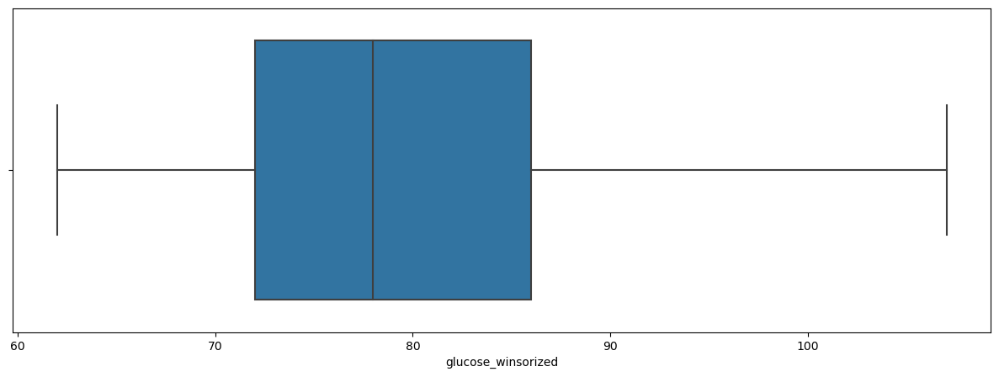

In [109]:
sns.boxplot(heart_transformed['glucose_winsorized'])

**Now there is no any outliers present in our data**

## Key Insights from Exploratory Data Analysis (EDA)
- The bar plot analysis above indicates an imbalance within our target variable:
- The dataset reveals that a predominant majority (97% of people) do not take blood pressure medication (BPMeds), while a smaller subset (2.96% of people) indicates individuals who are on such medication.
- 97.4% of individuals are non-diabetic, while only 2.57% are affected by diabetes.
- Prevalent stroke affects only 0.59% of individuals, leaving 99.4% unaffected.
- 31% of people are affected by Prevalent Hypertension, and 69% are unaffected.
- The analysis of the clustered bar chart indicates a slightly higher likelihood of developing coronary heart disease after ten years among males compared to females.
- The data indicates that the onset of Coronary Heart Disease typically begins around the age of 35. As age increases, the risk increases.
- People having total cholesterol more than 240 are more prone to risk. This feature has some outliers.
- From the visualization, it is observed that individuals classified as overweight have a higher likelihood of being affected by Coronary Heart Disease.
- As per the data, having a low cigsPerDay does not necessarily guarantee a significantly lower risk of Coronary Heart Disease (CHD).
- People who might have heart disease often have higher systolic blood pressure, around 139 mm Hg or more.
- We have a total of 124 records for people taking blood pressure medication, and out of those, 41 individuals are at risk of heart disease.
- We have a total of 109 records for individuals with diabetes, and among them, 40 individuals are at risk of heart disease.
- SysBP and diaBP show a positive correlation.
- Looking at the bar plot, it is evident that individuals with high cholesterol levels are more likely to have heart disease.
- Individuals in the obese category usually develop heart disease later in life, typically around the age of 57.
- The data indicates a positive correlation, signifying that an increase in systolic blood pressure is accompanied by a corresponding rise in diastolic blood pressure, and this trend is associated with an elevated likelihood of heart disease.
- Individuals with diabetes and higher glucose levels exhibit a higher likelihood of being affected by heart disease.

In [110]:
heart_transformed.head(2)

,age,cigsPerDay,totChol,BMI,heartRate,glucose,sysBP,diaBP,gender,currentSmoker,...,BMI_Category,chol_category,cholesterol_category,totCholestrol_encoded,diaBP_category_refined,diaBP_encoded,BMI_category_encoded,HeartRateCategory,heartRate_category_encoded,glucose_winsorized
0,39.0,-0.94808,195.0,26.97,80.0,77.0,-1.467715,70.0,1,0,...,Overweight,Desirable,141-240,1,66-70,5,2,Medium,1,77.0
1,46.0,-0.94808,250.0,28.73,95.0,76.0,-0.424183,81.0,0,0,...,Overweight,High,241-300,2,81-85,8,2,Medium,1,76.0


In [111]:
# drop double variables

heart_disease = heart_transformed.drop(columns = ['totChol', 'BMI', 'heartRate','glucose', 'diaBP','BMI_Category','chol_category','cholesterol_category', 'diaBP_category_refined', 'HeartRateCategory'])

In [112]:
heart_disease.head(3)

,age,cigsPerDay,sysBP,gender,currentSmoker,BPMeds,prevalentStroke,prevalentHyp,diabetes,TenYearCHD,totCholestrol_encoded,diaBP_encoded,BMI_category_encoded,heartRate_category_encoded,glucose_winsorized
0,39.0,-0.948080,-1.467715,1,0,0.0,0,0,0,0,1,5,2,1,77.0
1,46.0,-0.948080,-0.424183,0,0,0.0,0,0,0,0,2,8,2,1,76.0
2,48.0,1.145211,-0.058316,1,1,0.0,0,0,0,0,2,7,2,0,70.0


In [113]:
heart_disease.shape

(4169, 15)

## Feature Selection

### 1. Using Chi-Square Test

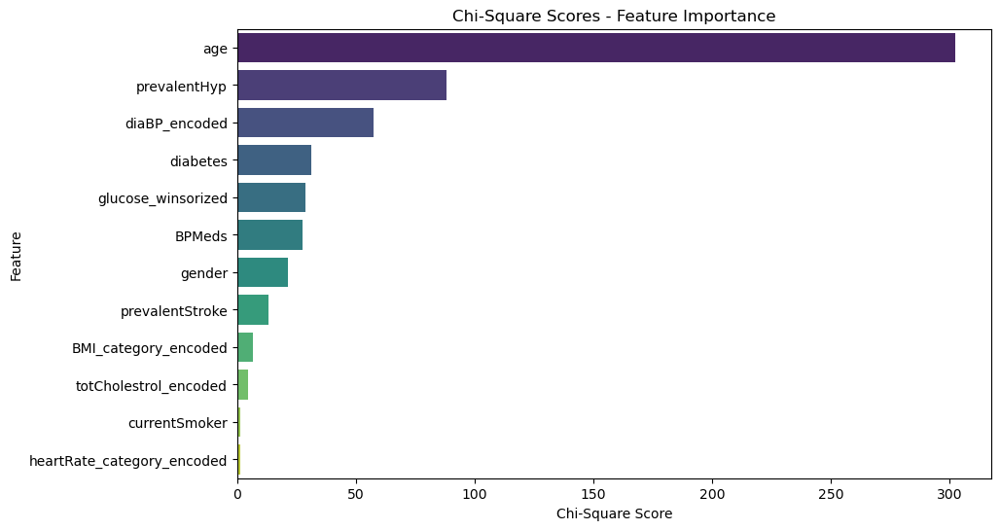

In [114]:
# Not used sysBP and cigsPerDay because it contains negative values
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = heart_disease.drop(['TenYearCHD', 'cigsPerDay', 'sysBP'], axis=1)
y = heart_disease['TenYearCHD']

k_best = 12
chi2_selector = SelectKBest(chi2, k=k_best)
X_new = chi2_selector.fit_transform(X, y)

# Get selected feature indices
selected_features = chi2_selector.get_support()

# Create a DataFrame with column names and chi-square scores
features_df = pd.DataFrame({'Feature': X.columns, 'Chi2 Score': chi2_selector.scores_})

# Filter the DataFrame based on selected features
features_df = features_df[features_df['Feature'].isin(X.columns[selected_features])]

# Sort the DataFrame by chi-square scores in descending order
features_df = features_df.sort_values(by='Chi2 Score', ascending=False)

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x='Chi2 Score', y='Feature', data=features_df, palette='viridis')
plt.title('Chi-Square Scores - Feature Importance')
plt.xlabel('Chi-Square Score')
plt.ylabel('Feature')
plt.show()

### 2. Using Ensemble methods (Random Forest)

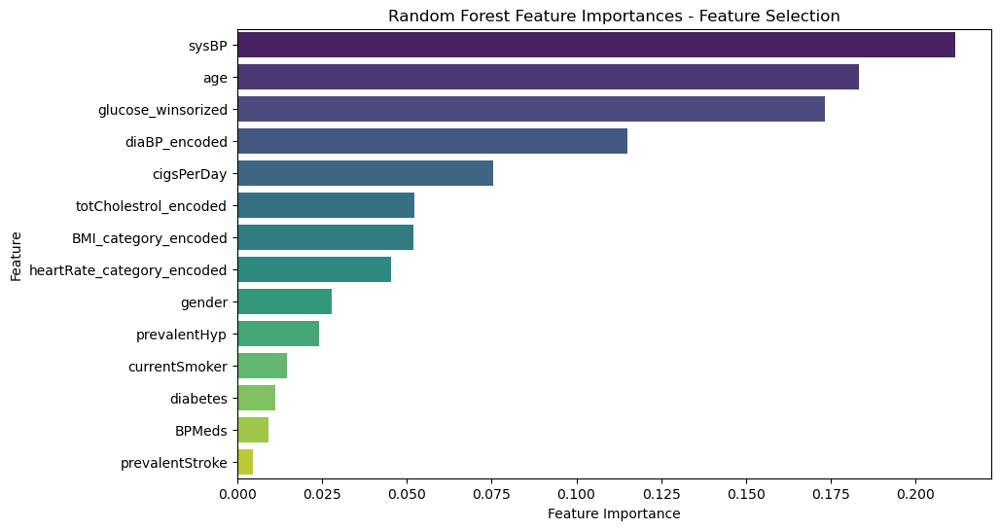

In [115]:
from sklearn.ensemble import RandomForestClassifier
X = heart_disease.drop(['TenYearCHD'], axis=1)
y = heart_disease['TenYearCHD']

# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to the data
rf_classifier.fit(X, y)

# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame with feature names and importances
features_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importances in descending order
features_df = features_df.sort_values(by='Importance', ascending=False)

# Select the top k features
k_best = 14
selected_features_df = features_df.head(k_best)

# Plot the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=selected_features_df, palette='viridis')
plt.title('Random Forest Feature Importances - Feature Selection')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.show()

In [116]:
heart_disease['BPMeds'] = heart_disease['BPMeds'].astype('int')

In [117]:
heart_disease['BPMeds'].unique()

array([0, 1])

In [118]:
# code for smote and underSampling together

# # Import necessary libraries
# from imblearn.over_sampling import SMOTE
# from imblearn.under_sampling import RandomUnderSampler
# from sklearn.compose import ColumnTransformer
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import train_test_split, GridSearchCV
# from sklearn.pipeline import Pipeline as skPipeline
# from sklearn.preprocessing import StandardScaler, OneHotEncoder

# X = heart_disease[['age', 'gender',  'prevalentHyp', 'sysBP', 'BPMeds', 'diabetes', 'cigsPerDay', 'glucose_winsorized']]
# y = heart_disease['TenYearCHD']

# # Define preprocessor
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('num', StandardScaler(), ['age', 'sysBP', 'cigsPerDay', 'glucose_winsorized']),
#         ('cat', OneHotEncoder(), ['gender', 'prevalentHyp', 'BPMeds', 'diabetes'])
#     ])

# # Create a pipeline that preprocesses the data and then trains a classifier
# clf = skPipeline(steps=[('preprocessor', preprocessor),
#                         ('classifier', RandomForestClassifier(random_state=42))])

# # Define the resampling strategy
# over = SMOTE(sampling_strategy=0.4)  # Adjust this value  0.2
# under = RandomUnderSampler(sampling_strategy=0.6)  # Adjust this value 0.7

# # Apply resampling to the data
# X_resampled, y_resampled = over.fit_resample(X, y)
# X_resampled, y_resampled = under.fit_resample(X_resampled, y_resampled)

# # Split resampled data into train and test sets
# X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# # Define the hyperparameters and the values you want to test
# param_grid = {
#     'classifier__n_estimators': [50, 100, 200],
#     'classifier__max_depth': [None, 10, 20],
#     'classifier__min_samples_split': [2, 5, 10],
#     'classifier__min_samples_leaf': [1, 2, 4]
# }

# # Create Grid Search object
# grid_search = GridSearchCV(clf, param_grid, cv=5)

# # Train the model
# grid_search.fit(X_train, y_train)

# # Print the best parameters
# print("Best Parameters: ", grid_search.best_params_)

## Load and Prepare Data

In [119]:
X = heart_disease[['age', 'gender', 'BPMeds', 'diabetes' , 'prevalentHyp', 'sysBP', 'BMI_category_encoded', 'cigsPerDay', 'glucose_winsorized', 'totCholestrol_encoded']]
y = heart_disease['TenYearCHD']

## Data Preprocessing Pipeline

In [120]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline as skPipeline

# Assuming heartRate_category_encoded, BMI_category_encoded, totCholestrol_encoded are ordinal encoded
ordinal_encoded_column = ['BMI_category_encoded', 'totCholestrol_encoded']

# Define preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['age', 'sysBP', 'cigsPerDay', 'glucose_winsorized']),
        ('cat', OneHotEncoder(),  ['gender', 'prevalentHyp', 'BPMeds', 'diabetes'] + ordinal_encoded_column)
    ])

# Create a pipeline that preprocesses the data and then trains a classifier
clf = skPipeline(steps=[('preprocessor', preprocessor),
                        ('classifier', RandomForestClassifier(random_state=42))])


In [121]:
# # Define preprocessor
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('num', StandardScaler(), ['age', 'sysBP', 'cigsPerDay', 'glucose_winsorized']),
#         ('cat', OneHotEncoder(), ['gender', 'prevalentHyp'])
#     ])

# # Create a pipeline that preprocesses the data and then trains a classifier
# clf = skPipeline(steps=[('preprocessor', preprocessor),
#                         ('classifier', RandomForestClassifier(random_state=42))])

## Resampling with SMOTE

In [122]:
# Define the resampling strategy
over = SMOTE(sampling_strategy='auto')  # Adjust this value  0.2


# Apply resampling to the data
X_resampled, y_resampled = over.fit_resample(X, y)

## Train Test Split

In [123]:
# Split resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [124]:
X_train

,age,gender,BPMeds,diabetes,prevalentHyp,sysBP,BMI_category_encoded,cigsPerDay,glucose_winsorized,totCholestrol_encoded
5121,47.000000,0,0,0,1,0.453790,1,1.058779,107.000000,2
3418,40.000000,0,0,0,0,-1.157507,1,-0.948080,76.000000,1
2226,43.000000,1,0,0,0,-0.193880,1,-0.948080,83.400000,1
6280,49.469418,1,0,0,1,0.896542,2,1.301708,94.530582,1
530,40.000000,0,0,0,0,-0.193880,1,1.145211,80.000000,2
...,...,...,...,...,...,...,...,...,...,...
3772,65.000000,0,1,0,1,1.523849,1,-0.948080,62.000000,3
5191,52.000000,0,0,0,1,1.343288,1,-0.948080,107.000000,1
5226,48.494094,1,0,0,0,0.276049,1,1.145211,73.494094,1
5390,55.000000,0,0,0,0,0.217591,2,-0.948080,91.081550,1


### Hyperparameter Tuning with Randomized SearchCV

In [125]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

random_search = RandomizedSearchCV(clf, param_distributions = param_dist, n_iter=10, cv=5)
random_search.fit(X_train, y_train)

print("Best Parameters: ", random_search.best_params_)

Best Parameters:  {'classifier__n_estimators': 200, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 1, 'classifier__max_depth': None}


### Hyperparameter Tuning with Grid SearchCV

In [126]:
# # Define the hyperparameters and the values you want to test
# param_grid = {
#     'classifier__n_estimators': [50, 100, 200],
#     'classifier__max_depth': [None, 10, 20],
#     'classifier__min_samples_split': [2, 5, 10],
#     'classifier__min_samples_leaf': [1, 2, 4]
# }

# # Create Grid Search object
# grid_search = GridSearchCV(clf, param_grid, cv=5)

# # Train the model
# grid_search.fit(X_train, y_train)

# # Print the best parameters
# print("Best Parameters: ", grid_search.best_params_)

### Model Evaluation 

In [127]:
from sklearn.metrics import accuracy_score, classification_report

# Make predictions on the test set
y_pred = random_search.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate and print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Accuracy: 0.82
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.81      0.82       722
           1       0.81      0.84      0.82       696

    accuracy                           0.82      1418
   macro avg       0.82      0.82      0.82      1418
weighted avg       0.82      0.82      0.82      1418



### Try Different Algorithms to Find the Best

## 1. Random Forest Classifier

In [128]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

# Creating a Random Forest classifier with specified hyperparameters
rf = RandomForestClassifier(max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=200)

# Training the model
rf.fit(X_train, y_train)

# Predicting the labels for the test set
y_pred_rf = rf.predict(X_test)

# Calculating the accuracy of the model
accuracy = round(accuracy_score(y_test, y_pred_rf), 2)
print("Accuracy:", accuracy)

Accuracy: 0.85


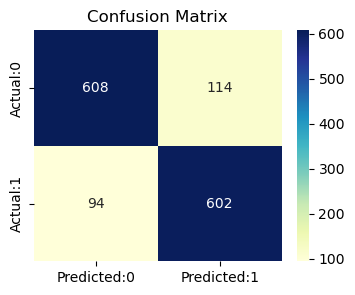

In [129]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_rf)

# Create a DataFrame for the confusion matrix
conf_matrix_data = {
    'Predicted:0': cm[:, 0],
    'Predicted:1': cm[:, 1]
}

conf_matrix = pd.DataFrame(data=conf_matrix_data, index=['Actual:0', 'Actual:1'])

# Plot the heatmap with decreased size
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="YlGnBu")

plt.title('Confusion Matrix')
plt.show()

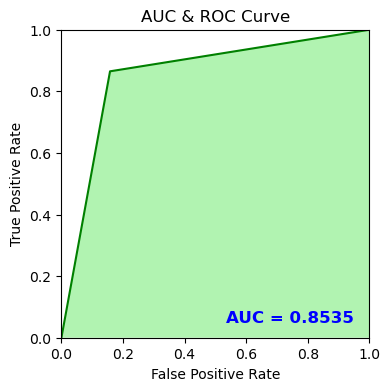

In [130]:
from sklearn.metrics import roc_curve, auc

# Calculate auc
from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_rf)
auc
false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred_rf)

plt.figure(figsize=(6, 4), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

## 2. K - Nearest Neighbour

In [131]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, fbeta_score

# Creating a K-Nearest Neighbors classifier with, for example, k=3 (you can adjust the value of k)
knn = KNeighborsClassifier(n_neighbors=3)

# Training the model
knn.fit(X_train, y_train)

# Predicting the labels for the test set
y_pred_knn = knn.predict(X_test)

# Calculating the accuracy of the model
accuracy = accuracy_score(y_test, y_pred_knn)
print("Accuracy:", accuracy)

Accuracy: 0.8159379407616361


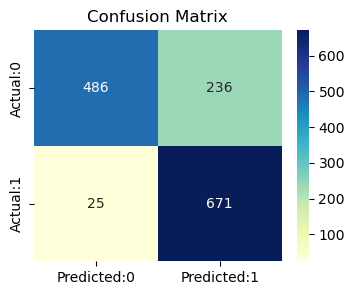

In [132]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_knn)

# Create a DataFrame for the confusion matrix
conf_matrix_data = {
    'Predicted:0': cm[:, 0],
    'Predicted:1': cm[:, 1]
}

conf_matrix = pd.DataFrame(data=conf_matrix_data, index=['Actual:0', 'Actual:1'])

# Plot the heatmap with decreased size
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="YlGnBu")

plt.title('Confusion Matrix')
plt.show()

In [133]:
from sklearn.metrics import classification_report

report = classification_report(y_test, y_pred_knn)

print(report)

              precision    recall  f1-score   support

           0       0.95      0.67      0.79       722
           1       0.74      0.96      0.84       696

    accuracy                           0.82      1418
   macro avg       0.85      0.82      0.81      1418
weighted avg       0.85      0.82      0.81      1418



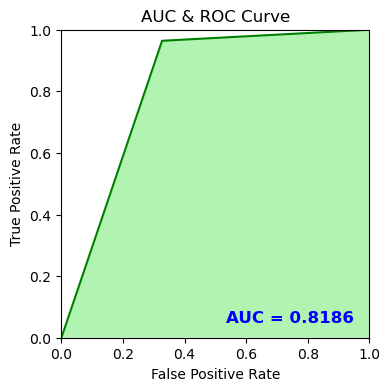

In [134]:
from sklearn.metrics import roc_curve, auc

# Calculate auc
from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_knn)
auc
false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred_knn)

plt.figure(figsize=(6, 4), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

## 3. XG boost

In [135]:
import xgboost as xgb
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, fbeta_score

# Creating an XGBoost classifier
xgb_classifier = xgb.XGBClassifier()

# Training the model
xgb_classifier.fit(X_train, y_train)

# Predicting the labels for the test set
y_pred_xgb = xgb_classifier.predict(X_test)

# Calculating the accuracy of the model
accuracy = accuracy_score(y_test, y_pred_xgb)
print("Accuracy:", accuracy)

Accuracy: 0.8737658674188998


In [136]:
from sklearn.metrics import classification_report

report = classification_report(y_test, y_pred_xgb)

print(report)

              precision    recall  f1-score   support

           0       0.87      0.89      0.88       722
           1       0.88      0.86      0.87       696

    accuracy                           0.87      1418
   macro avg       0.87      0.87      0.87      1418
weighted avg       0.87      0.87      0.87      1418



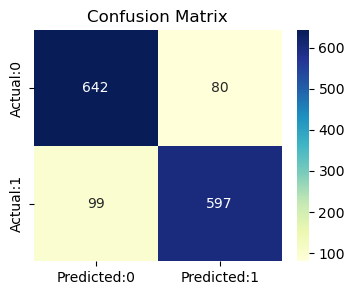

In [137]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_xgb)

# Create a DataFrame for the confusion matrix
conf_matrix_data = {
    'Predicted:0': cm[:, 0],
    'Predicted:1': cm[:, 1]
}

conf_matrix = pd.DataFrame(data=conf_matrix_data, index=['Actual:0', 'Actual:1'])

# Plot the heatmap with decreased size
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="YlGnBu")

plt.title('Confusion Matrix')
plt.show()

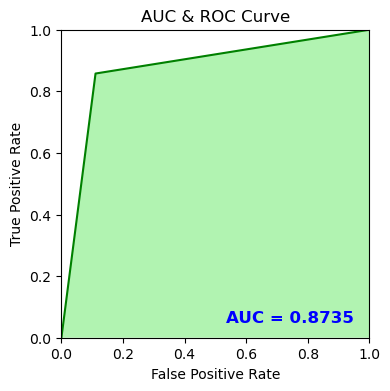

In [138]:
from sklearn.metrics import roc_curve, auc

# Calculate auc
from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_xgb)
auc
false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred_xgb)

plt.figure(figsize=(6, 4), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

### 4. ExtraTreesClassifier

In [139]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score

# Initialize ExtraTreesClassifier
extra_trees_model = ExtraTreesClassifier(random_state=42)

# Fit the model
extra_trees_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_etc = extra_trees_model.predict(X_test)

# Evaluate the accuracy
accuracy = accuracy_score(y_test, y_pred_etc)
print(f'Accuracy: {accuracy}')


Accuracy: 0.842031029619182


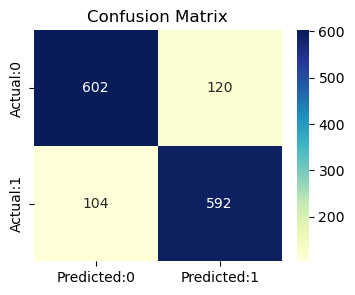

In [140]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_etc)

# Create a DataFrame for the confusion matrix
conf_matrix_data = {
    'Predicted:0': cm[:, 0],
    'Predicted:1': cm[:, 1]
}

conf_matrix = pd.DataFrame(data=conf_matrix_data, index=['Actual:0', 'Actual:1'])

# Plot the heatmap with decreased size
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="YlGnBu")

plt.title('Confusion Matrix')
plt.show()

In [141]:
from sklearn.metrics import classification_report

report = classification_report(y_test, y_pred_etc)

print(report)

              precision    recall  f1-score   support

           0       0.85      0.83      0.84       722
           1       0.83      0.85      0.84       696

    accuracy                           0.84      1418
   macro avg       0.84      0.84      0.84      1418
weighted avg       0.84      0.84      0.84      1418



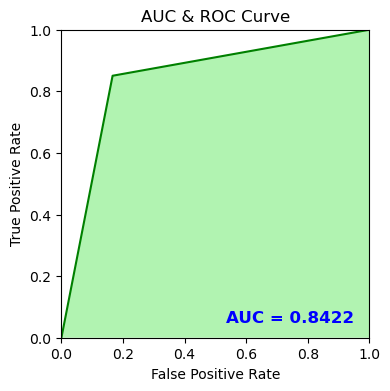

In [142]:
from sklearn.metrics import roc_curve, auc

# Calculate auc
from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_etc)
auc
false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred_etc)

plt.figure(figsize=(6, 4), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

### 5. Gradient Boosting

In [143]:
from sklearn.ensemble import GradientBoostingClassifier

gb_clf = GradientBoostingClassifier(n_estimators = 500, learning_rate = 0.2, max_depth = 3, random_state = 42)

gb_clf.fit(X_train, y_train)

train_pred = gb_clf.predict(X_train)

test_pred = gb_clf.predict(X_test)

train_accuracy = accuracy_score(y_train, train_pred)

test_accuracy = accuracy_score(y_test, test_pred)

print(f"Training Accuracy: {train_accuracy}")
print(f"Test Accuracy: {test_accuracy}")

print(classification_report(y_test, test_pred))

Training Accuracy: 0.9493827160493827
Test Accuracy: 0.8801128349788434
              precision    recall  f1-score   support

           0       0.87      0.91      0.88       722
           1       0.90      0.85      0.87       696

    accuracy                           0.88      1418
   macro avg       0.88      0.88      0.88      1418
weighted avg       0.88      0.88      0.88      1418



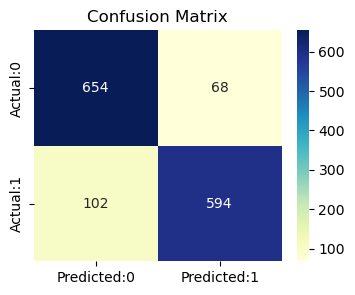

In [144]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, test_pred)

# Create a DataFrame for the confusion matrix
conf_matrix_data = {
    'Predicted:0': cm[:, 0],
    'Predicted:1': cm[:, 1]
}

conf_matrix = pd.DataFrame(data=conf_matrix_data, index=['Actual:0', 'Actual:1'])

# Plot the heatmap with decreased size
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="YlGnBu")

plt.title('Confusion Matrix')
plt.show()

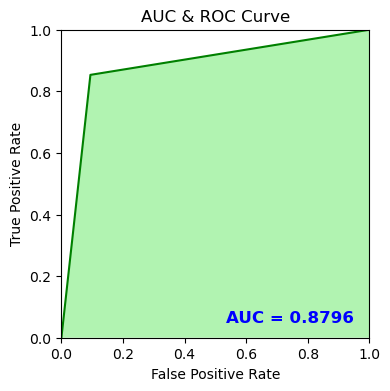

In [145]:
from sklearn.metrics import roc_curve, auc

# Calculate auc
from sklearn import metrics
auc = metrics.roc_auc_score(y_test, test_pred)
auc
false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, test_pred)

plt.figure(figsize=(6, 4), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

## Conclusion

1. The two most important factors for predicting the risk of heart disease over ten years are age and systolic blood pressure.


2. The K Nearest Neighbour model worked best for avoiding false negatives (i.e., Type-II Error), but when considering the overall performance using the Area Under Curve (AUC), XG Boost and Gradient Boosting showed a high ability to correctly identify positive cases.


3. Making the dataset more balanced using the SMOTE technique helped improve the models' ability to catch potential issues, especially when compared to other models.


4. Getting more data, especially from the minority group, can help us build better models for predicting outcomes.

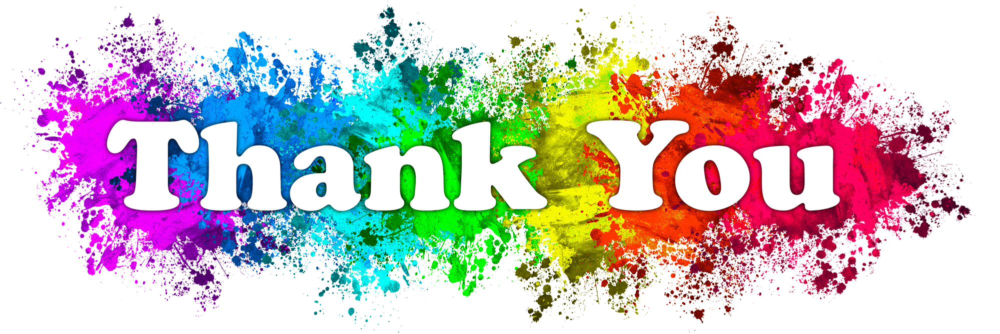